In [1]:
import os
os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = ".99"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import pandas as pd
import dcmnet
import sys

sys.path.append("/home/boittier/jaxeq/dcmnet")
print(sys.path)
from dcmnet.models import DCM1, DCM2, DCM3, DCM4, dcm1_params, dcm2_params, dcm3_params, dcm4_params
from dcmnet.modules import MessagePassingModel
from dcmnet.data import prepare_datasets 

# os.environ['CUDA_VISIBLE_DEVICES'] = ''


import jax
import jax.numpy as jnp
import pickle
from tensorboardX import SummaryWriter
import time
from utils import safe_mkdir
from dcmnet.training import train_model
from pathlib import Path
from dcmnet.data import prepare_batches, prepare_datasets
from dcmnet.utils import apply_model
from dcmnet.plotting import evaluate_dc, plot_esp, plot_model


devices = jax.local_devices()
print(devices)
print(jax.default_backend())
print(jax.devices())



['/pchem-data/meuwly/boittier/home/jaxeq/notebooks', '/home/boittier/psi4conda/envs/jaxe3xcuda11py39/lib/python39.zip', '/home/boittier/psi4conda/envs/jaxe3xcuda11py39/lib/python3.9', '/home/boittier/psi4conda/envs/jaxe3xcuda11py39/lib/python3.9/lib-dynload', '', '/pchem-data/meuwly/boittier/home/.local/lib/python3.9/site-packages', '/home/boittier/psi4conda/envs/jaxe3xcuda11py39/lib/python3.9/site-packages', '/home/boittier/jaxeq', '/home/boittier/jaxeq/dcmnet']


CUDA backend failed to initialize: INTERNAL: no supported devices found for platform CUDA (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


[CpuDevice(id=0)]
cpu
[CpuDevice(id=0)]


<Figure size 640x480 with 0 Axes>

<Figure size 100x100 with 0 Axes>

In [2]:
class Args:
    def __init__(self):
        self.data_dir = "/pchem-data/meuwly/boittier/home/jaxeq/"
        self.esp_w = 1000
        self.n_mp = 2
        self.learning_rate = 0.0001
        self.num_epochs = 2
        self.restart = None
        self.data = "qm9-esp40000-0.npz"
        self.num_epics = 1
        self.random_seed = 0
        self.n_dcm = 2
        


In [3]:
args = Args()

In [4]:
NATOMS = 60
data_key, train_key = jax.random.split(jax.random.PRNGKey(args.random_seed), 2)

# Model hyperparameters.
features = 16
max_degree = 2
num_iterations = args.n_mp
num_basis_functions = 8
cutoff = 4.0

n_dcm = args.n_dcm
# Training hyperparameters.
learning_rate = args.learning_rate
batch_size = 1
esp_w = args.esp_w
restart_params = args.restart
if restart_params is not None:
    restart_params = pd.read_pickle(restart_params)
params = restart_params
data_file = Path(args.data_dir) / args.data

# train_data, valid_data = prepare_datasets(
#     data_key, args.ntrain, args.nvalid, filename=data_file
# )

train_data, valid_data = prepare_datasets(
    data_key,
    1,
    6906,
    # int(80000*0.8),
    # int(80000*0.1),
    [
        # Path(args.data_dir) / "data/qm9-esp-dip-40000-0.npz", 
     # Path(args.data_dir) / "data/qm9-esp40000-1.npz", 
     # Path(args.data_dir) / "data/qm9-esp40000-2.npz",
       Path(args.data_dir) / "data/qm9-esp-dip-6907-3.npz" 
    ]
)





R (6907, 60, 3)
Z (6907, 60)
N (6907,)
D (6907,)
com (6907, 3)
Dxyz (6907, 3)
mono (6907, 60, 1)
esp (6907, 3200)
id (6907,)
n_grid (6907,)
vdw_surface (6907, 3200, 3)
6907


In [5]:
# Create and train model.
message_passing_model = MessagePassingModel(
    features=features,
    max_degree=max_degree,
    num_iterations=num_iterations,
    num_basis_functions=num_basis_functions,
    cutoff=cutoff,
    n_dcm=n_dcm,
)


In [6]:
PARAMS = pd.read_pickle(
    "/pchem-data/meuwly/boittier/home/jaxeq/all_runs/runs7/"\
    "20240828-164431dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_10000_params.pkl")

PARAMS = pd.read_pickle(
    "/pchem-data/meuwly/boittier/home/jaxeq/all_runs/runs7/"\
    # "20240829-145230dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
"20240829-225716dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
# 

In [7]:
num_epochs = args.num_epochs


In [8]:
valid_data.keys()

dict_keys(['R', 'Z', 'N', 'mono', 'esp', 'vdw_surface', 'n_grid', 'D', 'Dxyz', 'com', 'id'])

In [9]:
import numpy as np
def pred_dipole(dcm, com, q):
    dipole_out = jnp.zeros(3)
    for i, _ in enumerate(dcm):
        dipole_out += q[i] * (_ - com) * 1.88873
    # print(dipole_out)
    return dipole_out 

In [10]:
valid_batches = prepare_batches(data_key, valid_data, batch_size, include_id=True)

In [11]:
for k in valid_batches[0].keys():
    print(k, valid_batches[0][k].shape)

R (60, 3)
Z (60,)
N (1,)
mono (60,)
esp (1, 3200)
vdw_surface (1, 3200, 3)
n_grid (1,)
D (1,)
Dxyz (1, 3)
com (1, 3)
id (1,)
dst_idx (3540,)
src_idx (3540,)
batch_segments (60,)


In [12]:
valid_batches[0]["dst_idx"].shape

(3540,)

In [91]:
# bad data
#'dsgdb9nsd_129340'

def test_dipole(batch, message_passing_model, dipo, mono):
    mono_test = batch["mono"]
    positions_test = batch["R"]
    D_test = batch["D"][0]
    # print(D_test)
    Dxyz_test = batch["Dxyz"][0]
    # print("gt:", Dxyz_test)
    com_test = batch["com"][0]
    
    # d = jnp.moveaxis(dipo, -1, -2).reshape(batch_size, NATOMS * message_passing_model.n_dcm, 3)
    m = mono.reshape(batch_size, NATOMS * message_passing_model.n_dcm)
    molecular_dipole = pred_dipole(dipo, com_test, m[0])
    # print(" m:", molecular_dipole)

    # from dcmnet.utils import atom_centered_dipole
    # print(Dxyz_test)
    true_dipole_au = jnp.linalg.norm(Dxyz_test)
    # print(jnp.linalg.norm(Dxyz_test))
    pred_Dxyz = pred_dipole(positions_test, com_test, mono_test) #* 1.88873 #* 4.80320 / 2.5417464519
    # print("pc:", pred_Dxyz)
    pred_D = np.linalg.norm(pred_Dxyz)
    
    # print(jnp.linalg.norm(molecular_dipole*2.5417464519), true_dipole_au*2.5417464519, 
          # jnp.linalg.norm(molecular_dipole*2.5417464519) - true_dipole_au*2.5417464519)
    # print(jnp.linalg.norm(Dxyz_test), pred_D)
    # print(" "+" ".join(["{:.5f}".format(float(_*2.5417464519)) for _ in [pred_D, true_dipole_au, pred_D - true_dipole_au]]))
    return jnp.linalg.norm(molecular_dipole*2.5417464519) - true_dipole_au*2.5417464519, (pred_D - true_dipole_au)*2.5417464519



In [92]:
randID = np.random.randint(len(valid_batches))
print(randID)
batch = valid_batches[randID]
print(batch["id"])

5730
['dsgdb9nsd_128411']


In [93]:
batch["R"].shape

(60, 3)

In [94]:
PARAMS = pd.read_pickle(
    "/pchem-data/meuwly/boittier/home/jaxeq/all_runs/runs7/"\
    "20240828-164431dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_10000_params.pkl")

PARAMS = pd.read_pickle(
    "/pchem-data/meuwly/boittier/home/jaxeq/all_runs/runs7/"\
    # "20240830-113204dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
    "20240830-141441dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")

PARAMS = pd.read_pickle(
    "/pchem-data/meuwly/boittier/home/jaxeq/all_runs/runs7/"\
    # "20240830-113204dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
    "20240830-171111dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
    # "20240831-005653dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")

# 20240831-005653dcm-2-espw-1000-qm9-esp40000-0.npz-re-False

In [95]:
import matplotlib.pyplot as plt

from tqdm import tqdm

In [96]:
PARAMS2 = pd.read_pickle(
"/pchem-data/meuwly/boittier/home/jaxeq/all_runs/runs7/"\
# "20240830-113204dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl"
# "20240830-171111dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl"
# "20240831-005653dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl"
"20240830-141441dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl"
)

PARAMS3 = pd.read_pickle(
    "/pchem-data/meuwly/boittier/home/jaxeq/all_runs/runs7/"\
    "20240830-165613dcm-3-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")

PARAMS4 = pd.read_pickle(
    "/pchem-data/meuwly/boittier/home/jaxeq/all_runs/runs7/"\
    # "20240830-113204dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
    # "20240830-163232dcm-4-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
    "20240831-005331dcm-4-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")


def plot_errors(message_passing_model, PARAMS, N=10, random=True):
    esp_errors = []
    dipole_errors = []
    
    for i in tqdm(range(N)):
        if random:
            randID = np.random.randint(len(valid_batches))
        else:
            randID = i
        batch = valid_batches[randID]
          
        mono, dipo = apply_model(message_passing_model, PARAMS, batch, batch_size)
        non_zero = jnp.nonzero(batch["Z"])
        error, esp, keys, _ = evaluate_dc(batch, dipo, mono, batch_size, message_passing_model.n_dcm,
                                               plot=False,
                                               id=True,
                                         )        
        error_dip = test_dipole(batch, message_passing_model, dipo, mono)
        esp_errors.append(error)
        dipole_errors.append(error_dip)
        # print(mono.shape)
    
    plt.hist(np.array(esp_errors).squeeze())
    print(np.array(esp_errors).squeeze().T.mean(axis=1))
    plt.show()
    plt.hist(np.absolute(np.array(dipole_errors)))
    print(np.absolute(np.array(dipole_errors)).T.mean(axis=-1))
    plt.show()
    

In [101]:
N = 10

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:12<00:00,  1.26s/it]

[2.0887396 1.8586147]


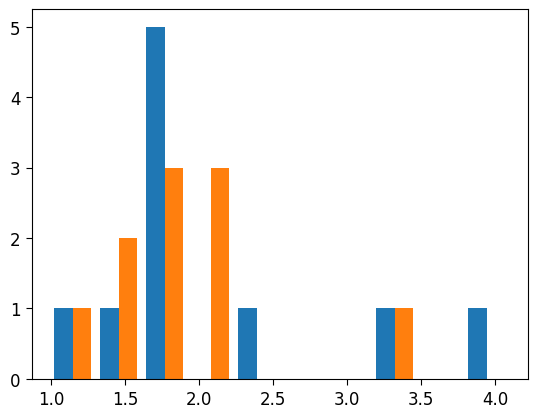

[0.3264315  0.22763188]


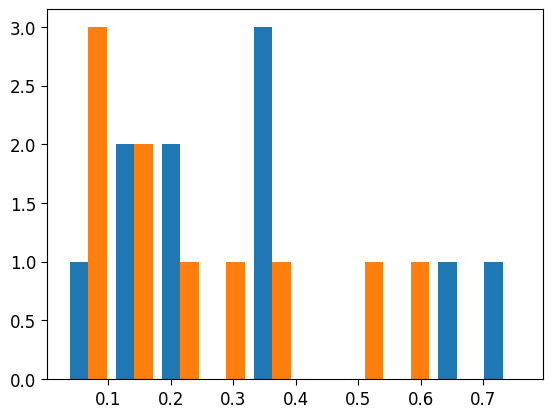

In [102]:
%load_ext autoreload
%autoreload 2
plot_errors(DCM2, PARAMS2, N=N)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:13<00:00,  1.34s/it]

[1.8325859 1.860163 ]


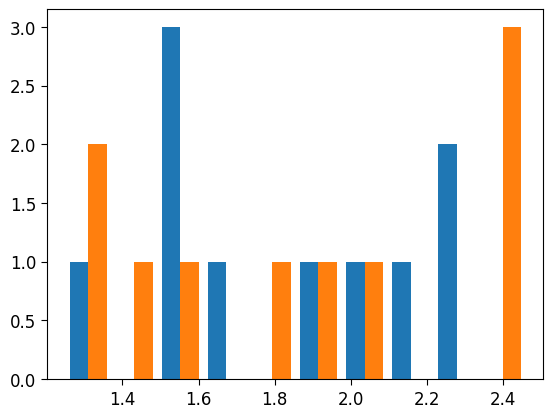

[0.20775321 0.20879968]


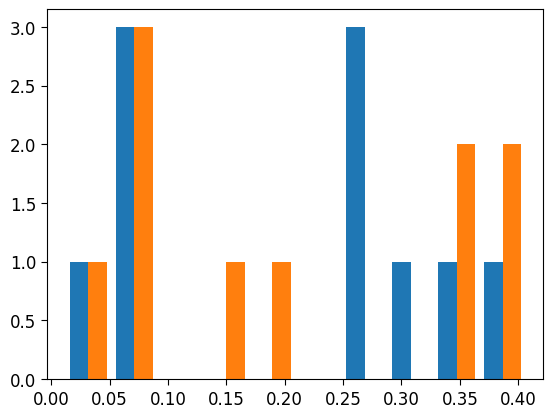

In [103]:
plot_errors(DCM3, PARAMS3, N=N)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:13<00:00,  1.31s/it]

[2.009709  2.1284966]


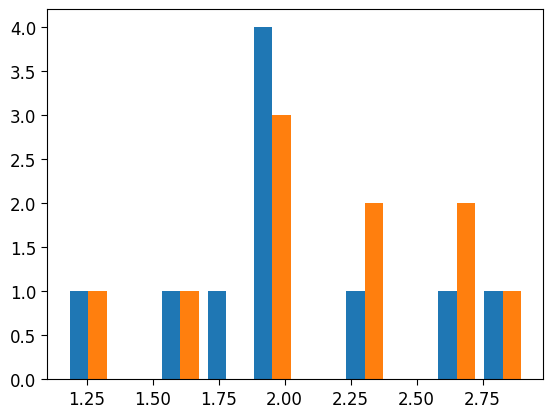

[0.20826045 0.2056139 ]


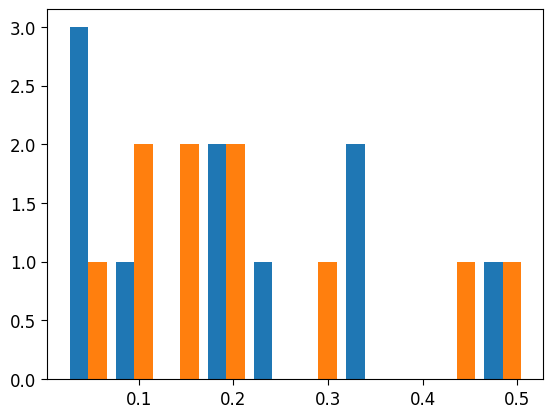

In [104]:
plot_errors(DCM4, PARAMS4, N=N)

In [135]:
dir(prepare_multiple_datasets)
import inspect
print(inspect.getsource(prepare_multiple_datasets))

def prepare_batches(key, data, batch_size, include_id=False):
    # Determine the number of training steps per epoch.
    data_size = len(data["mono"])
    steps_per_epoch = data_size // batch_size

    # Draw random permutations for fetching batches from the train data.
    perms = jax.random.permutation(key, data_size)
    perms = perms[
        : steps_per_epoch * batch_size
    ]  # Skip the last batch (if incomplete).
    perms = perms.reshape((steps_per_epoch, batch_size))

    # Prepare entries that are identical for each batch.
    num_atoms = len(data["atomic_numbers"][0])
    batch_segments = jnp.repeat(jnp.arange(batch_size), num_atoms)
    offsets = jnp.arange(batch_size) * num_atoms
    dst_idx, src_idx = e3x.ops.sparse_pairwise_indices(num_atoms)
    dst_idx = (dst_idx + offsets[:, None]).reshape(-1)
    src_idx = (src_idx + offsets[:, None]).reshape(-1)
    # Assemble and return batches.
    if include_id:
        return [
            dict(
                mono=data["mon

In [ ]:
prepare_multiple_datasets

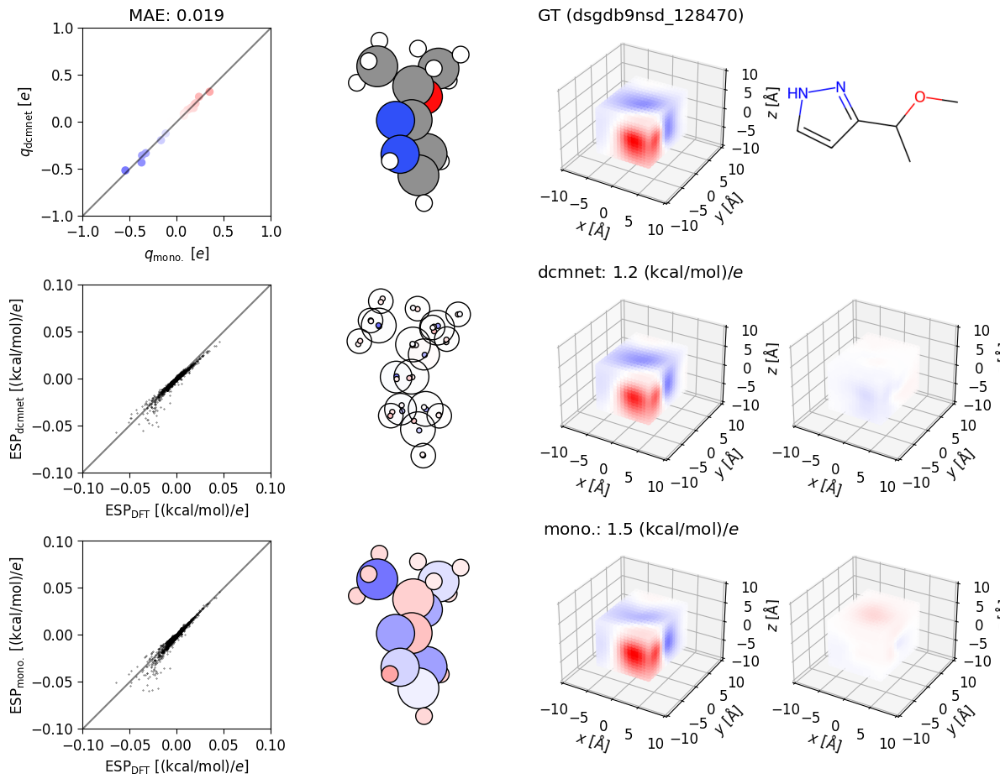

In [3302]:
mono, dipo = apply_model(message_passing_model, dcm2_params, batch, batch_size)
non_zero = jnp.nonzero(batch["atomic_numbers"])
error, esp, keys, _ = evaluate_dc(batch, dipo, mono, batch_size, message_passing_model.n_dcm,
                                       plot="Test",
                                       id=True,
                              )

In [3303]:
test_dipole(batch, message_passing_model,dipo, mono)

1.222686
gt: [ 0.3308146 -0.2920825 -0.1914436]
 m: [ 0.27482703 -0.13237506 -0.21280383]
pc: [ 0.3894967  -0.26006195 -0.05510622]
0.9453743 1.222686 -0.27731174
 1.19861 1.22269 -0.02408


3815
['dsgdb9nsd_129202']


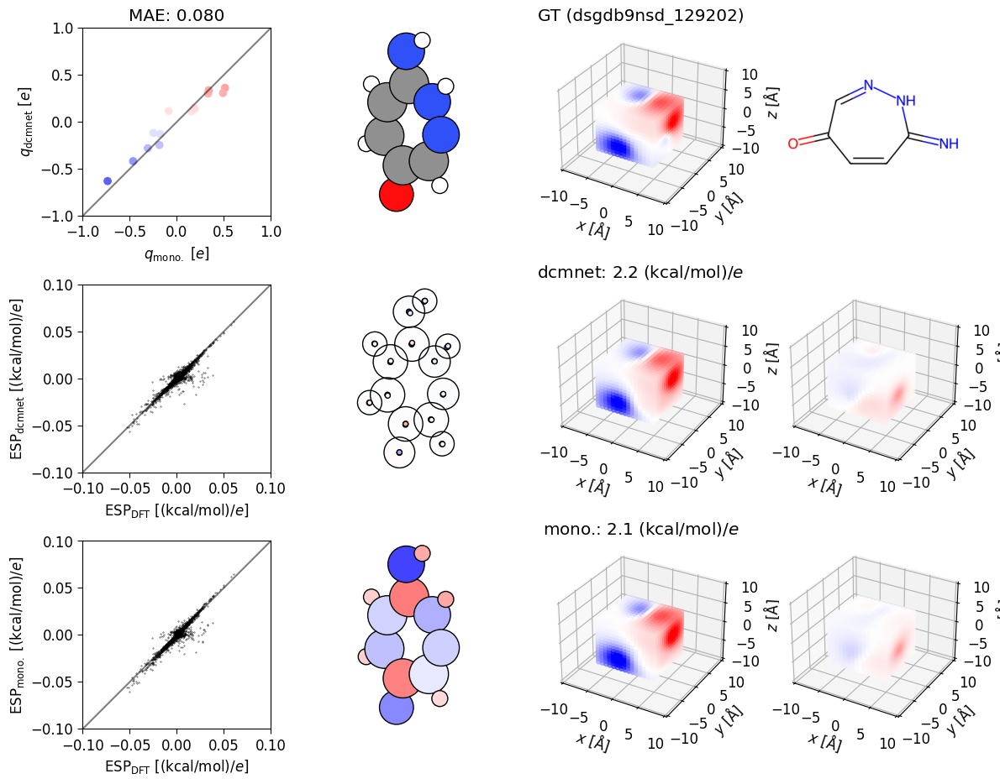

2.6388628
gt: [0.5836705 0.544366  0.6639813]
 m: [0.7790313  0.48493654 0.599154  ]
pc: [0.76793486 0.55754894 0.6843906 ]
2.7855482 2.6388626 0.1466856
 2.97393 2.63886 0.33506
4524
['dsgdb9nsd_130519']


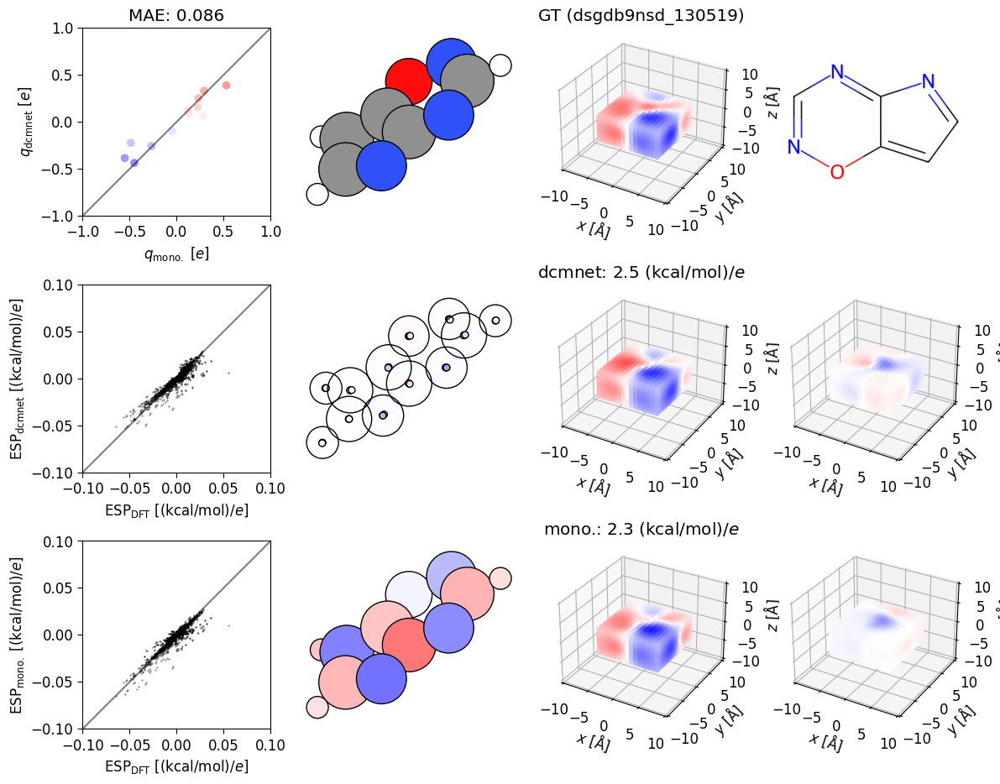

1.9900055
gt: [-0.7822342  0.0320079  0.0078761]
 m: [-0.889351    0.04508032  0.00964722]
pc: [-0.71051687  0.1734961   0.00799691]
2.2635396 1.9900053 0.2735343
 1.85913 1.99001 -0.13088
5714
['dsgdb9nsd_128958']


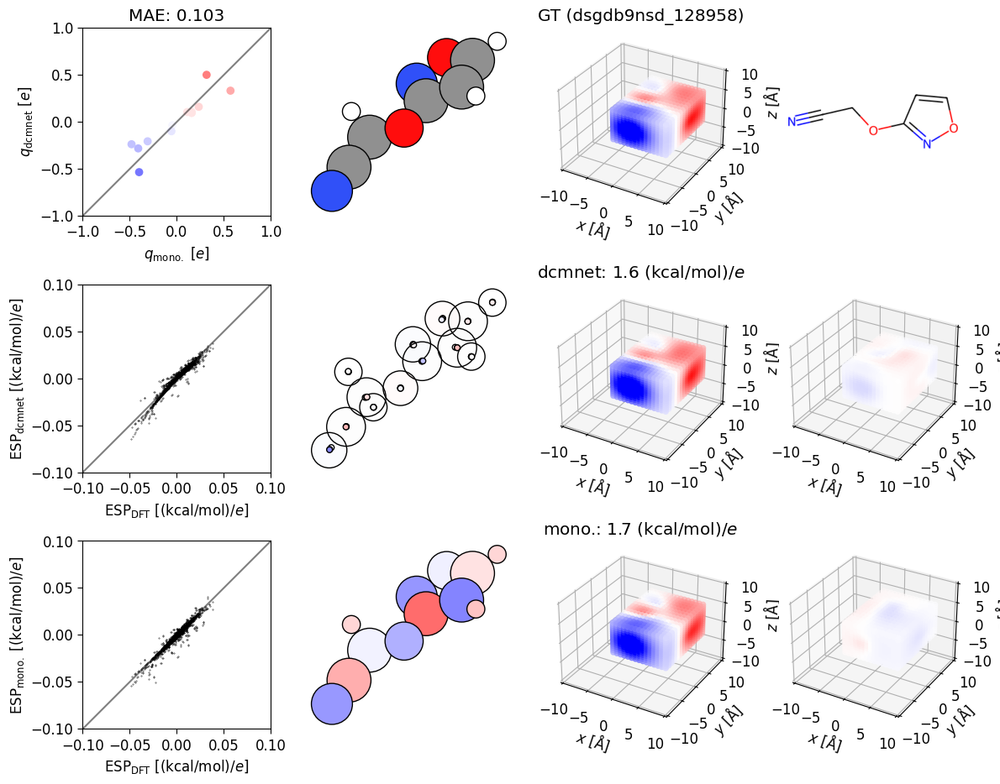

3.9461696
gt: [7.4045873e-01 1.3645912e+00 2.3670000e-04]
 m: [0.7331533  1.3949627  0.00249628]
pc: [0.5634681  1.3979566  0.00248663]
4.005522 3.9461694 0.059352398
 3.83103 3.94617 -0.11514
3093
['dsgdb9nsd_133790']


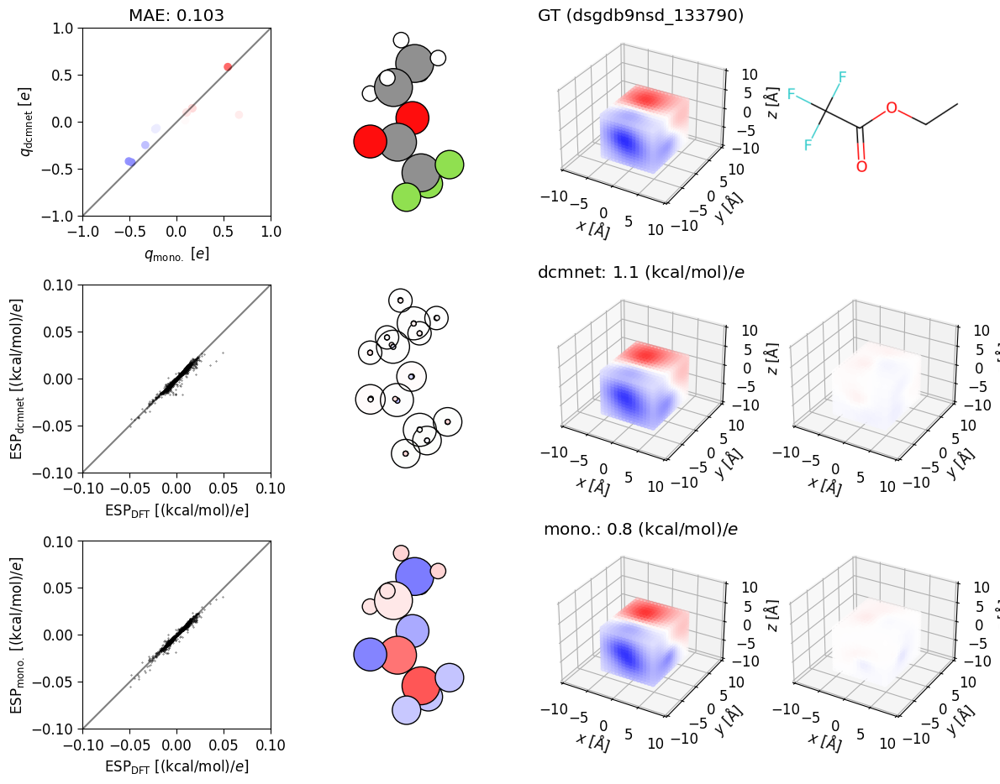

3.2533576
gt: [-0.3072922  1.134376   0.5070344]
 m: [-0.3407321  1.2248514  0.5606972]
pc: [-0.3406373   1.1656078   0.56645286]
3.5317843 3.2533574 0.2784269
 3.40589 3.25336 0.15253
6820
['dsgdb9nsd_132441']


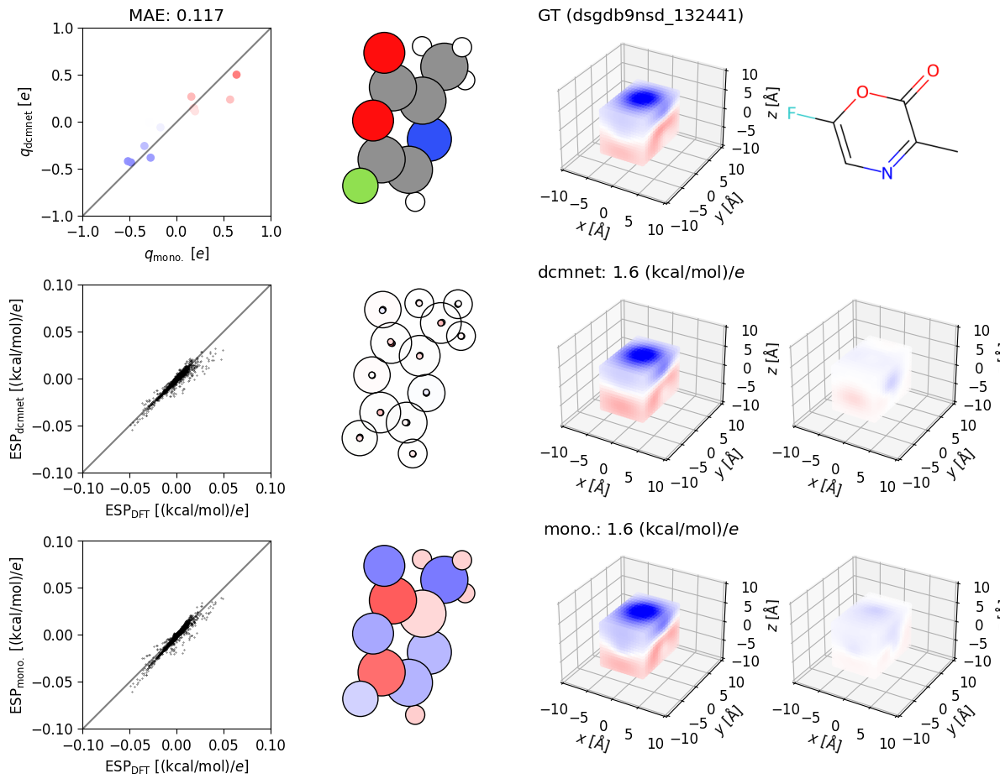

2.0607328
gt: [-0.0325229  0.0078938 -0.8100637]
 m: [-0.0355022   0.00932537 -0.87878424]
pc: [-0.04062682  0.10653749 -0.9706313 ]
2.2355943 2.0607328 0.17486143
 2.48406 2.06073 0.42333
4748
['dsgdb9nsd_129131']


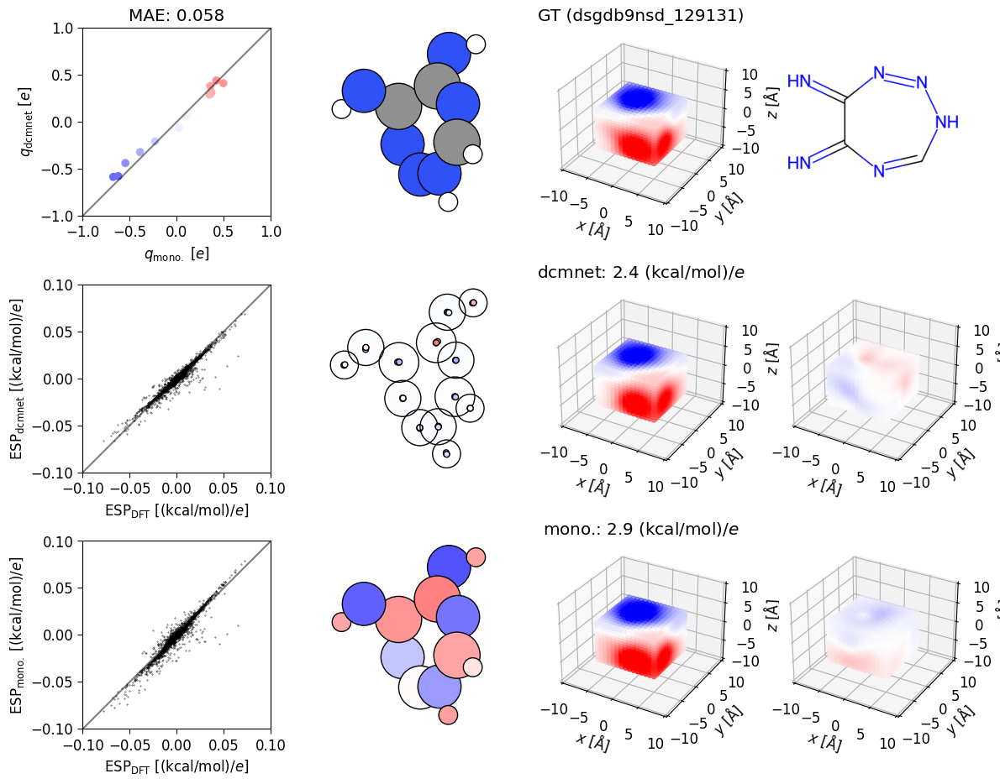

5.558967
gt: [ 1.2386653 -1.4112055 -1.1213676]
 m: [ 1.3173325 -1.2859241 -1.0712357]
pc: [ 1.2070744 -1.6337688 -1.4198732]
5.4136877 5.558967 -0.14527941
 6.29936 5.55897 0.74040
469
['dsgdb9nsd_128397']


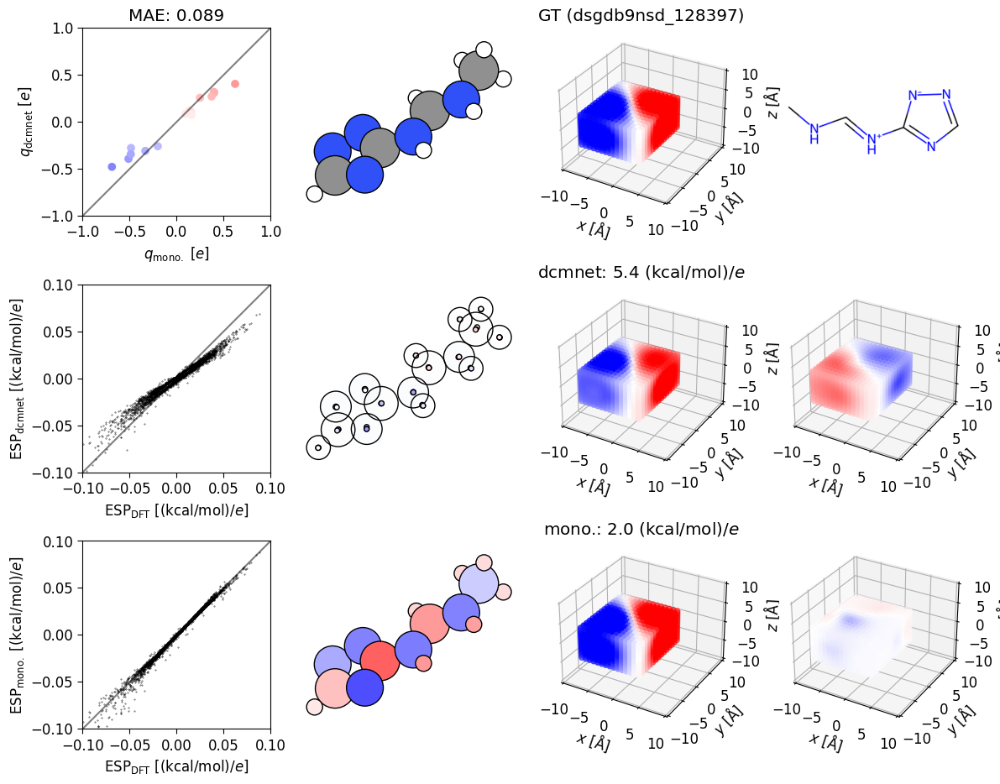

12.59836
gt: [ 3.929286   2.9969785 -0.3827262]
 m: [ 2.9151094   1.7245603  -0.32351765]
pc: [ 3.8712158   3.1557937  -0.35870478]
8.648153 12.59836 -3.9502068
 12.72753 12.59836 0.12917
4586
['dsgdb9nsd_127167']


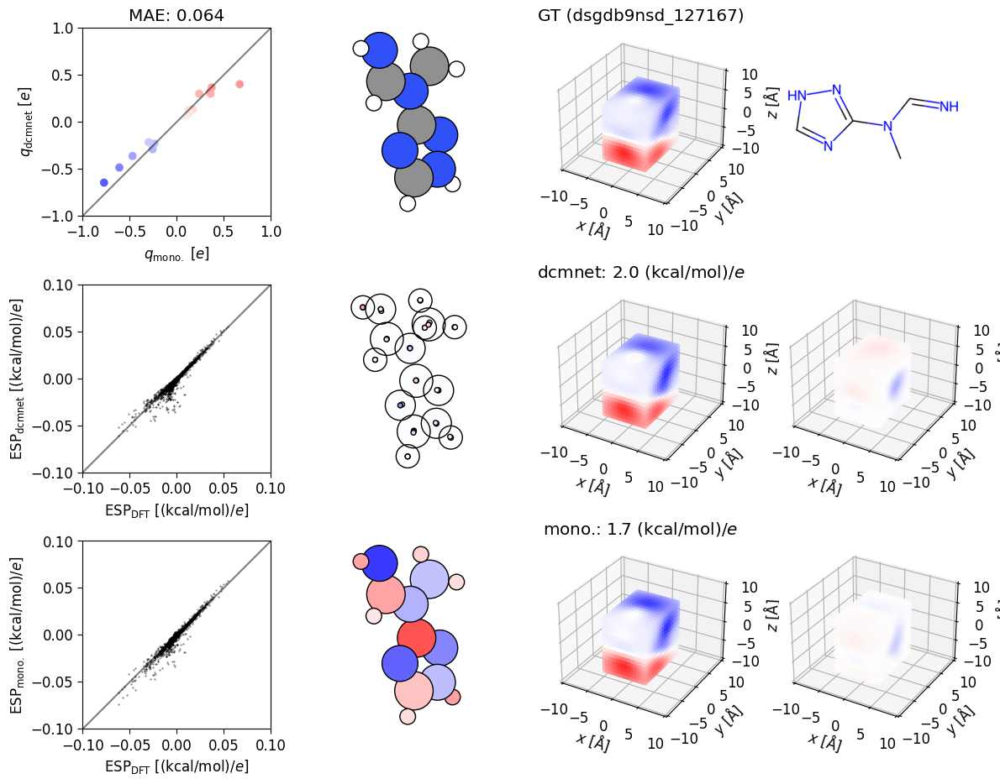

4.2417145
gt: [ 0.0262444 -0.7628979 -1.4839994]
 m: [ 0.02511308 -0.7750391  -1.4066792 ]
pc: [ 0.02611491 -0.77711827 -1.4952807 ]
4.0826983 4.241714 -0.15901566
 4.28377 4.24171 0.04206
18
['dsgdb9nsd_131157']


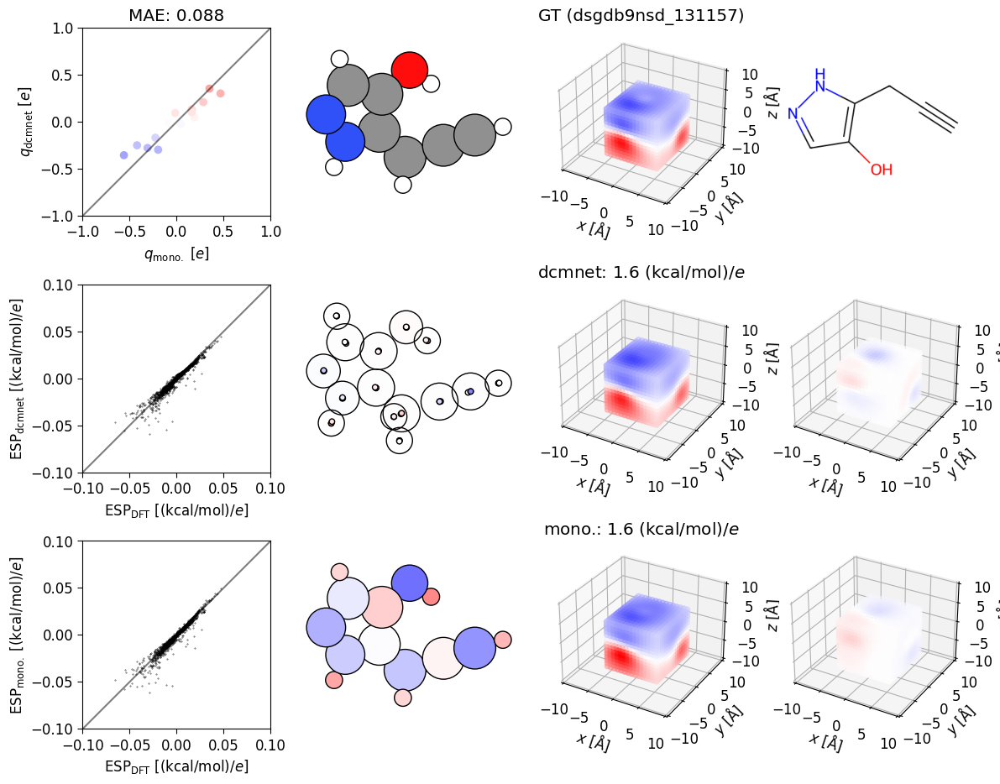

3.8952358
gt: [ 0.1501178 -0.1358049 -1.5190752]
 m: [ 0.13754065 -0.12980273 -1.5376966 ]
pc: [ 0.06556803 -0.25581256 -1.5212988 ]
3.9378839 3.8952358 0.042648077
 3.92458 3.89524 0.02935
313
['dsgdb9nsd_130073']


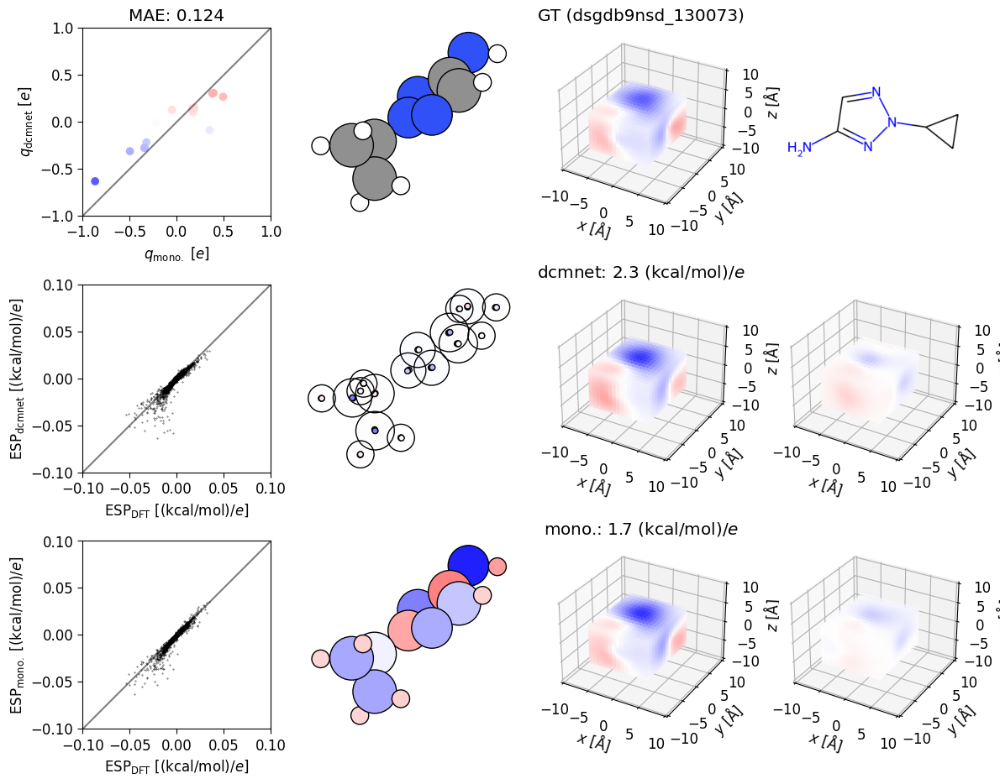

1.2295277
gt: [-0.0700478  0.1201624 -0.4633058]
 m: [-0.13867736 -0.0387595  -0.4585985 ]
pc: [-0.12209132  0.08971453 -0.6026125 ]
1.2217482 1.2295275 -0.0077792406
 1.57936 1.22953 0.34983


In [3364]:

for i in range(10):
    randID = np.random.randint(len(valid_batches))
    print(randID)
    batch = valid_batches[randID]
    print(batch["id"])
    
    
    PARAMS3 = pd.read_pickle(
        "/pchem-data/meuwly/boittier/home/jaxeq/runs7/"\
        "20240830-165613dcm-3-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
    # "20240831-012517dcm-3-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")

    mono, dipo = apply_model(DCM3, PARAMS3, batch, batch_size)
    non_zero = jnp.nonzero(batch["atomic_numbers"])
    error, esp, keys, _ = evaluate_dc(batch, dipo, mono, batch_size, DCM3.n_dcm,
                                           plot="Test",
                                           id=True,
                                  )
    
    test_dipole(batch, DCM3, dipo, mono)

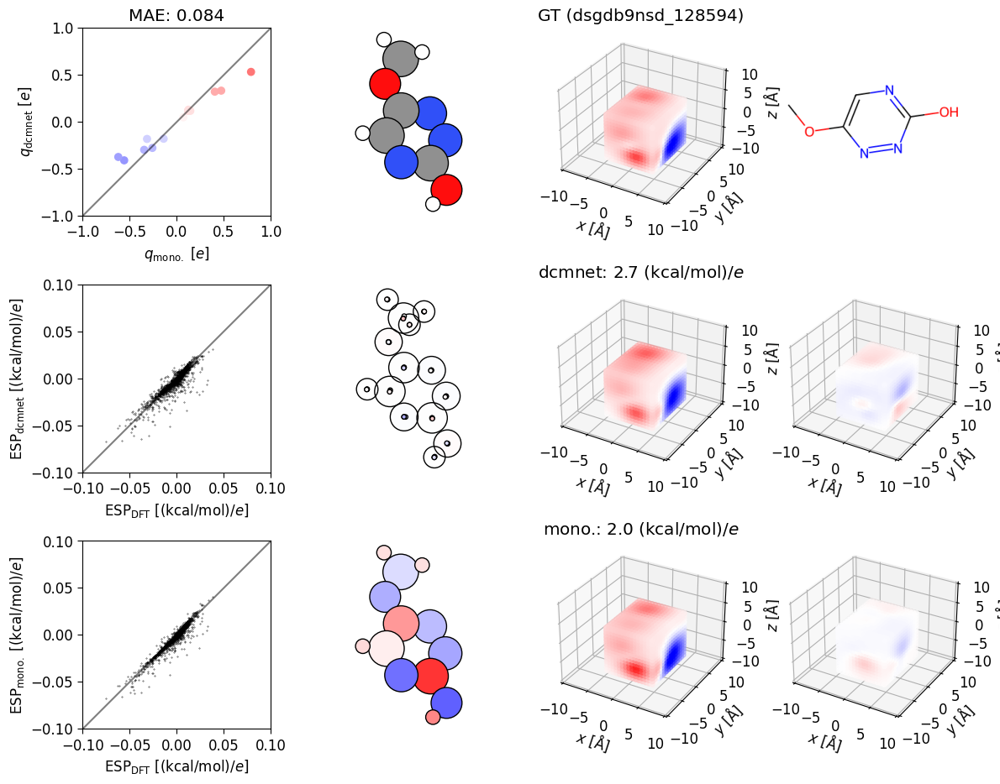

In [3324]:
mono, dipo = apply_model(DCM3, PARAMS3, batch, batch_size)
non_zero = jnp.nonzero(batch["atomic_numbers"])
error, esp, keys, _ = evaluate_dc(batch, dipo, mono, batch_size, DCM3.n_dcm,
                                       plot="Test",
                                       id=True,
                              )

In [3326]:
test_dipole(batch, DCM3, dipo, mono)

3.0008125
gt: [-0.5259572 -0.5058458  0.9280788]
 m: [-0.5343365  -0.40117013  0.9471172 ]
pc: [-0.5265585  -0.4602698   0.93097353]
2.9461067 3.0008125 -0.05470586
 2.95961 3.00081 -0.04121


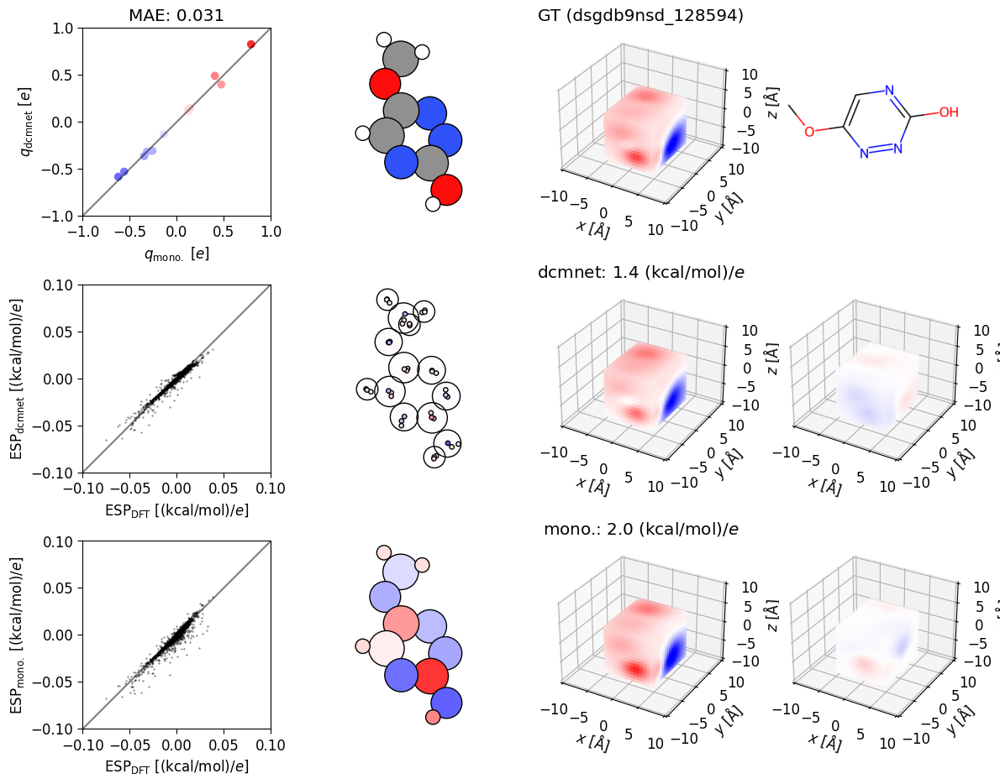

In [3327]:
mono, dipo = apply_model(DCM3, dcm3_params, batch, batch_size)
non_zero = jnp.nonzero(batch["atomic_numbers"])
error, esp, keys, _ = evaluate_dc(batch, dipo, mono, batch_size, DCM3.n_dcm,
                                       plot="Test",
                                       id=True,
                              )

In [3328]:
test_dipole(batch, DCM3, dipo, mono)

3.0008125
gt: [-0.5259572 -0.5058458  0.9280788]
 m: [-0.53137916 -0.33134875  0.9365179 ]
pc: [-0.5265585  -0.4602698   0.93097353]
2.8635247 3.0008125 -0.13728786
 2.95961 3.00081 -0.04121


6032
['dsgdb9nsd_131723']


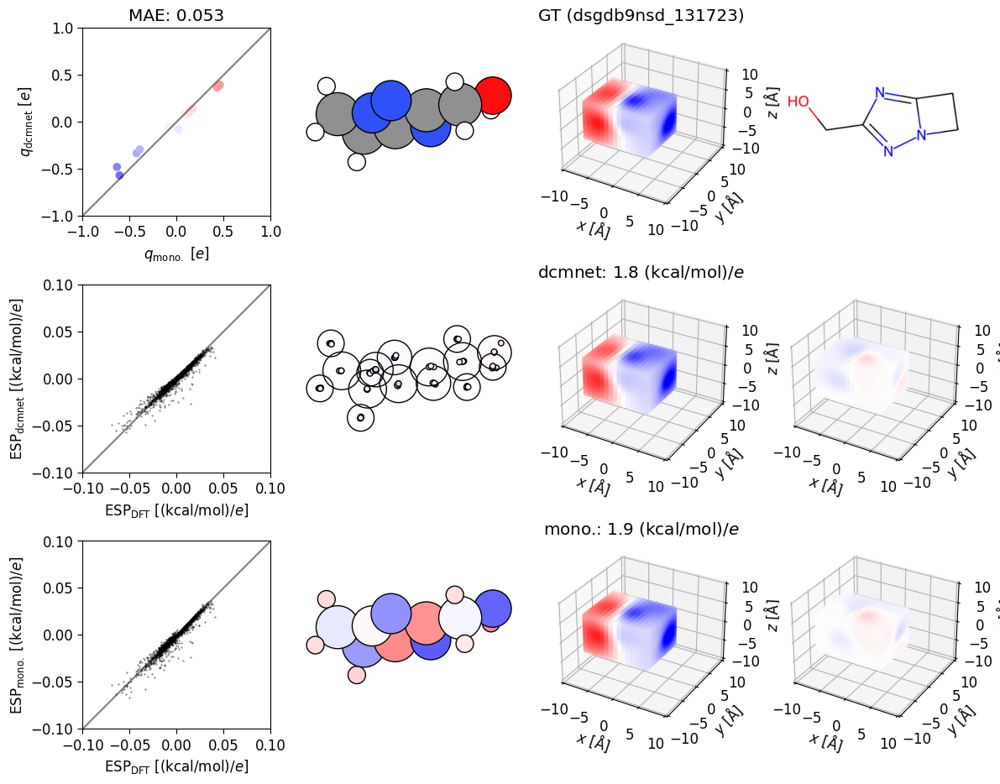

5.246775
gt: [-1.9357908 -0.7166753 -0.0133417]
 m: [-1.8675121  -0.6994445  -0.14350519]
pc: [-1.9193211  -0.76403236 -0.07217652]
5.081852 5.2467747 -0.16492271
 5.25395 5.24677 0.00718
274
['dsgdb9nsd_128056']


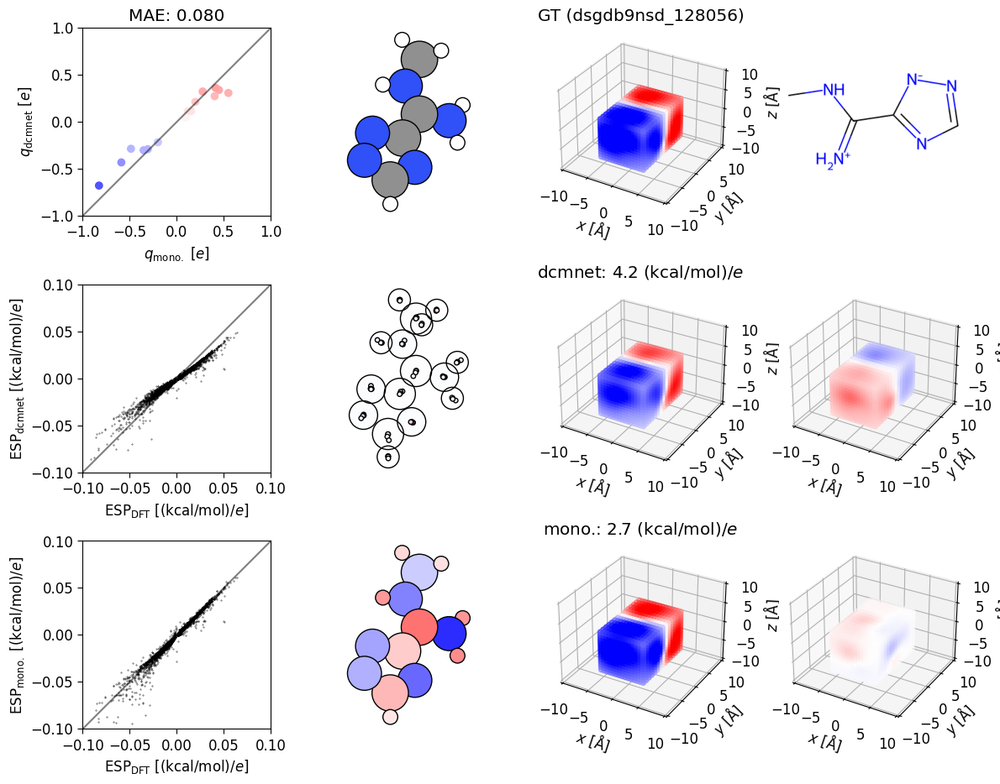

9.06919
gt: [ 0.1766773  3.5428717 -0.3848898]
 m: [ 0.23066382  2.5275352  -0.46237183]
pc: [ 0.11907959  3.528316   -0.28486884]
6.5572267 9.06919 -2.5119634
 9.00236 9.06919 -0.06683
3851
['dsgdb9nsd_133489']


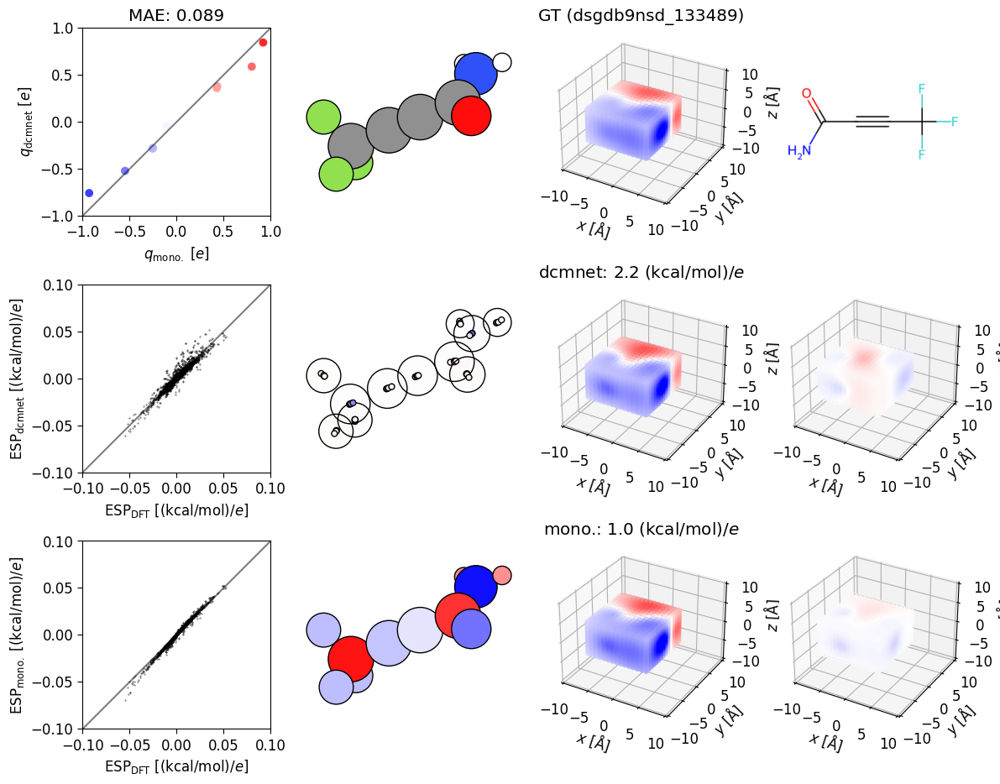

4.056544
gt: [-0.2529747  1.5757519  0.0109849]
 m: [-0.30022743  1.5219427   0.01101923]
pc: [-0.30014282  1.7040582   0.01193042]
3.9430406 4.0565434 -0.11350274
 4.39806 4.05654 0.34152
3526
['dsgdb9nsd_129687']


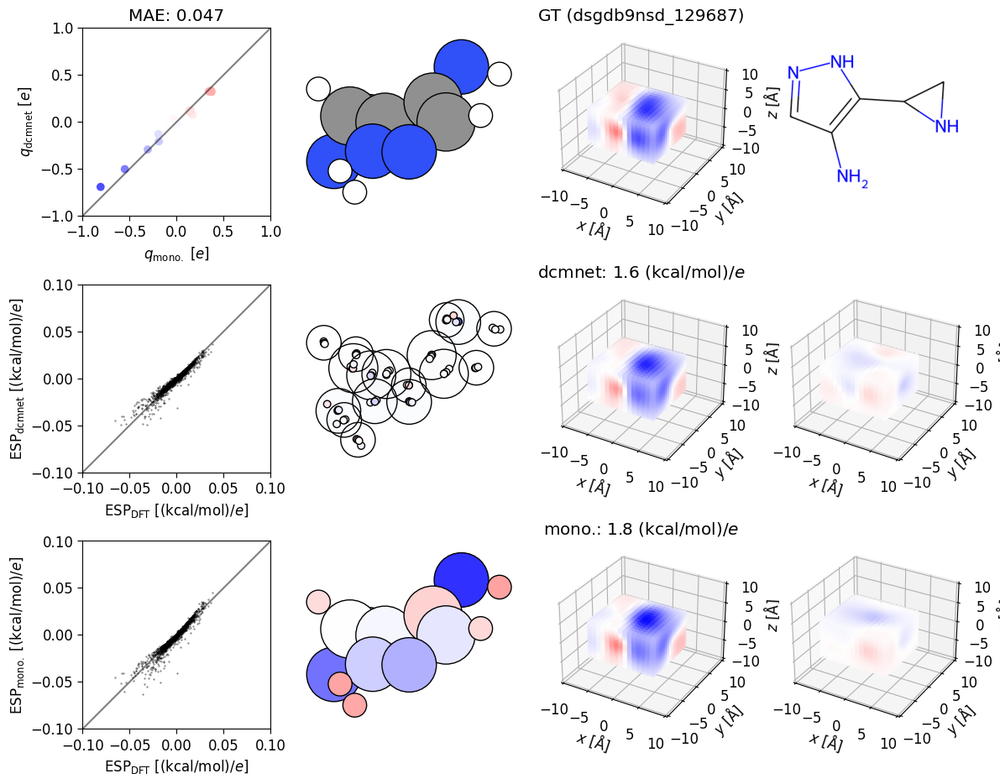

2.5318024
gt: [-0.373653   0.697843  -0.6046398]
 m: [-0.41602218  0.6568437  -0.62308407]
pc: [-0.307804    0.70419365 -0.711162  ]
2.5325181 2.5318024 0.0007157326
 2.66142 2.53180 0.12962
1213
['dsgdb9nsd_128076']


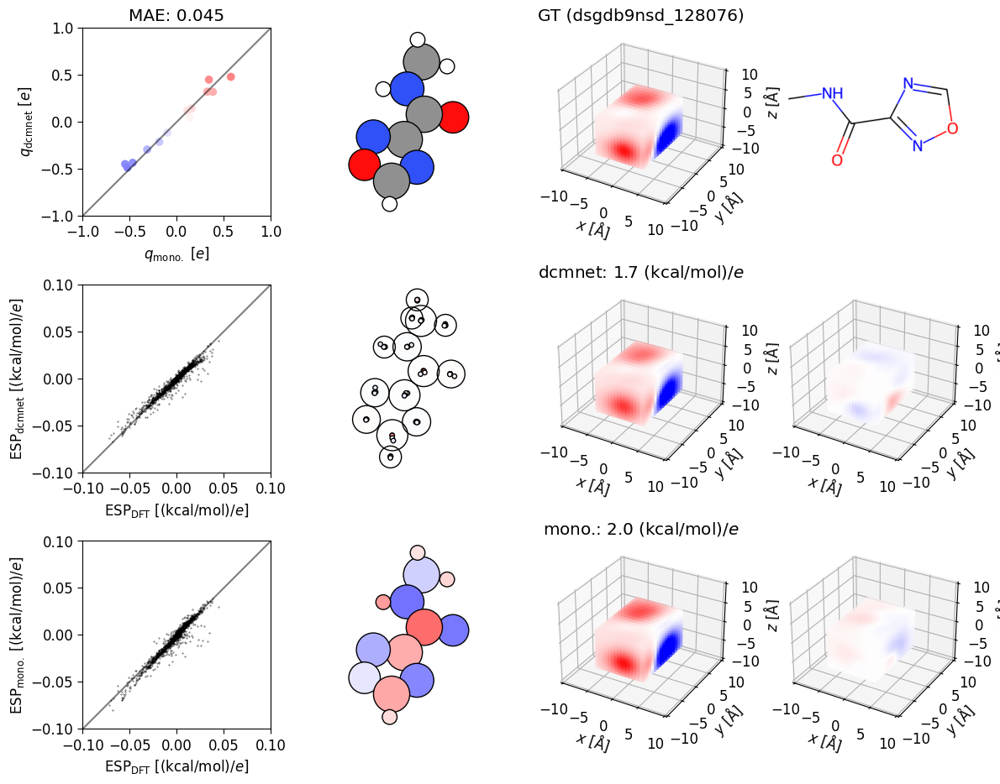

2.9502792
gt: [-0.7625709 -0.4425075  0.7549602]
 m: [-0.7221921  -0.47322783  0.6968877 ]
pc: [-0.86851573 -0.47303492  0.86249715]
2.8202603 2.9502792 -0.13001895
 3.33539 2.95028 0.38511
5969
['dsgdb9nsd_131252']


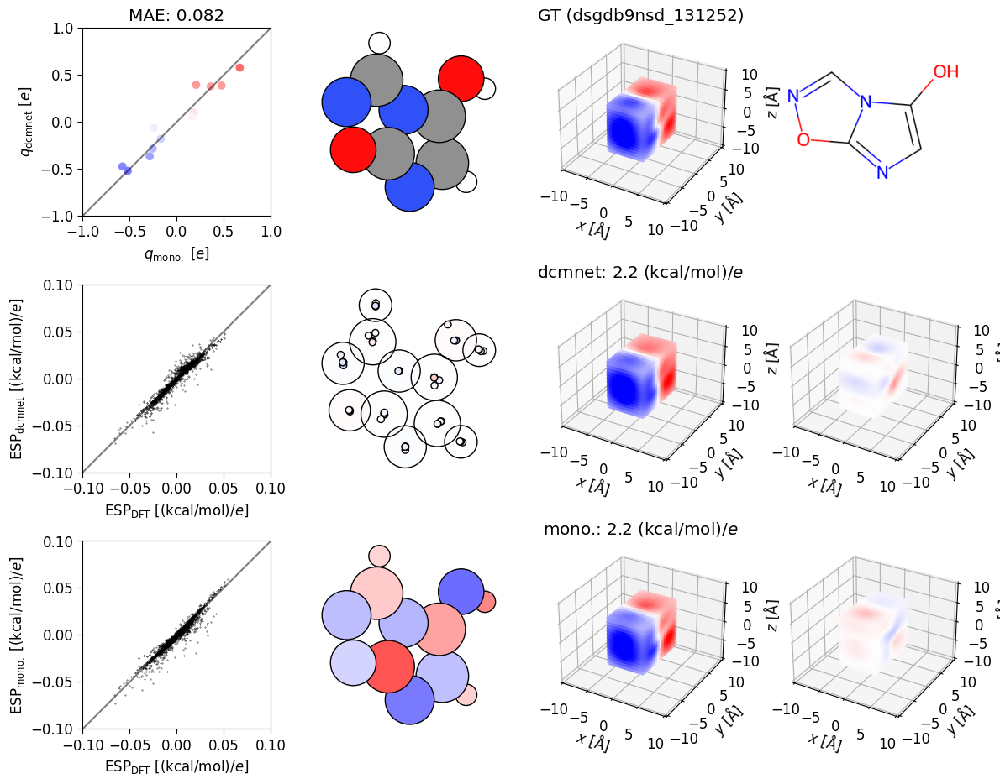

4.9005475
gt: [ 0.1558844  1.9162447 -0.1448502]
 m: [ 0.15479341  1.9583699  -0.13994291]
pc: [ 0.15199697  1.8700696  -0.1253733 ]
5.0058575 4.900547 0.10531044
 4.77955 4.90055 -0.12099
1097
['dsgdb9nsd_127354']


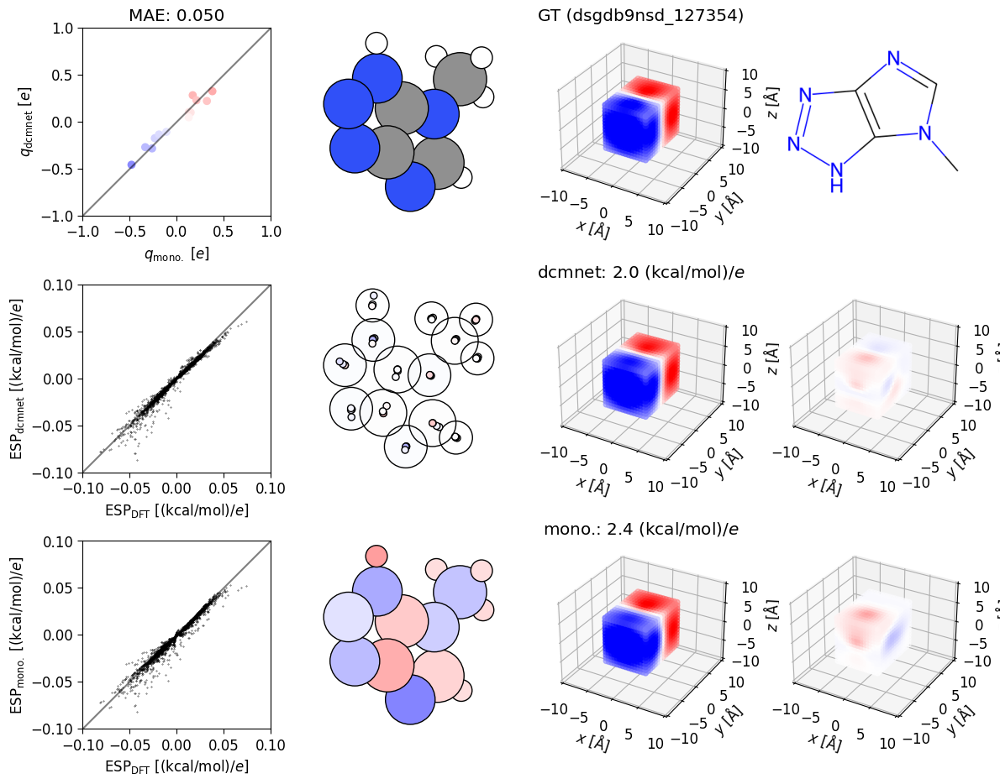

8.039922
gt: [-0.018635   3.159413  -0.1525487]
 m: [-0.01582011  3.0533495  -0.13346311]
pc: [-0.01529872  3.0812376  -0.06640136]
7.7683544 8.039922 -0.27156734
 7.83364 8.03992 -0.20628
6093
['dsgdb9nsd_131033']


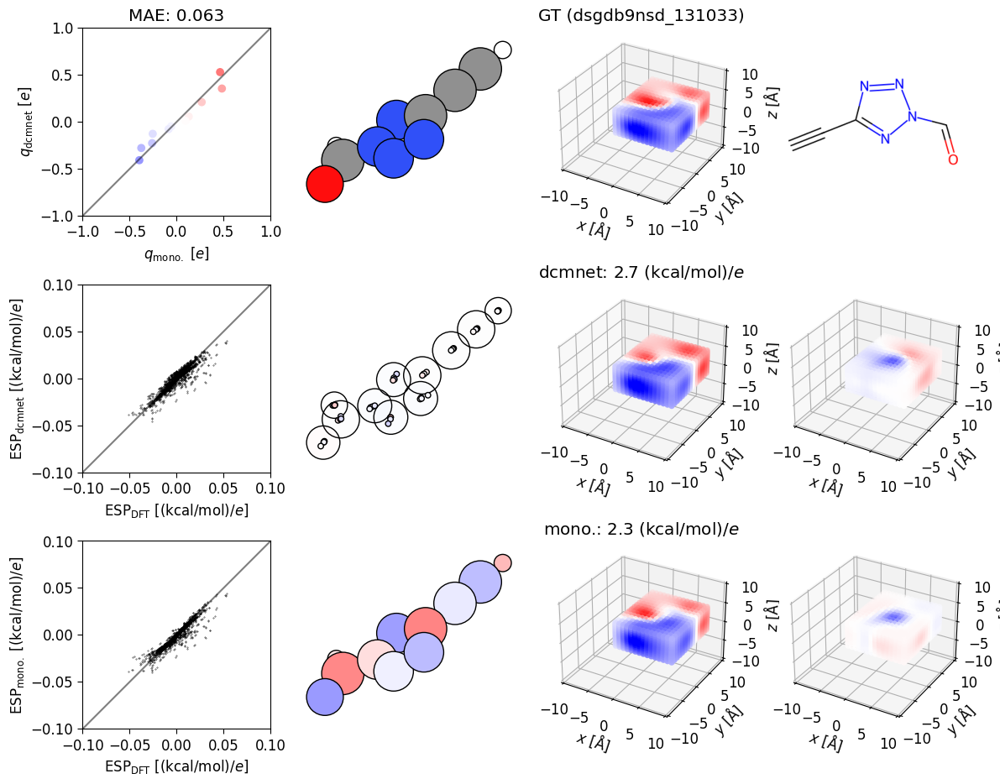

3.4863758
gt: [-0.4132652  1.3078094  0.0160811]
 m: [-0.20549372  1.4987994   0.0152056 ]
pc: [-0.44783545  1.2625637   0.01619315]
3.8454015 3.4863756 0.35902596
 3.40526 3.48638 -0.08111
5158
['dsgdb9nsd_127742']


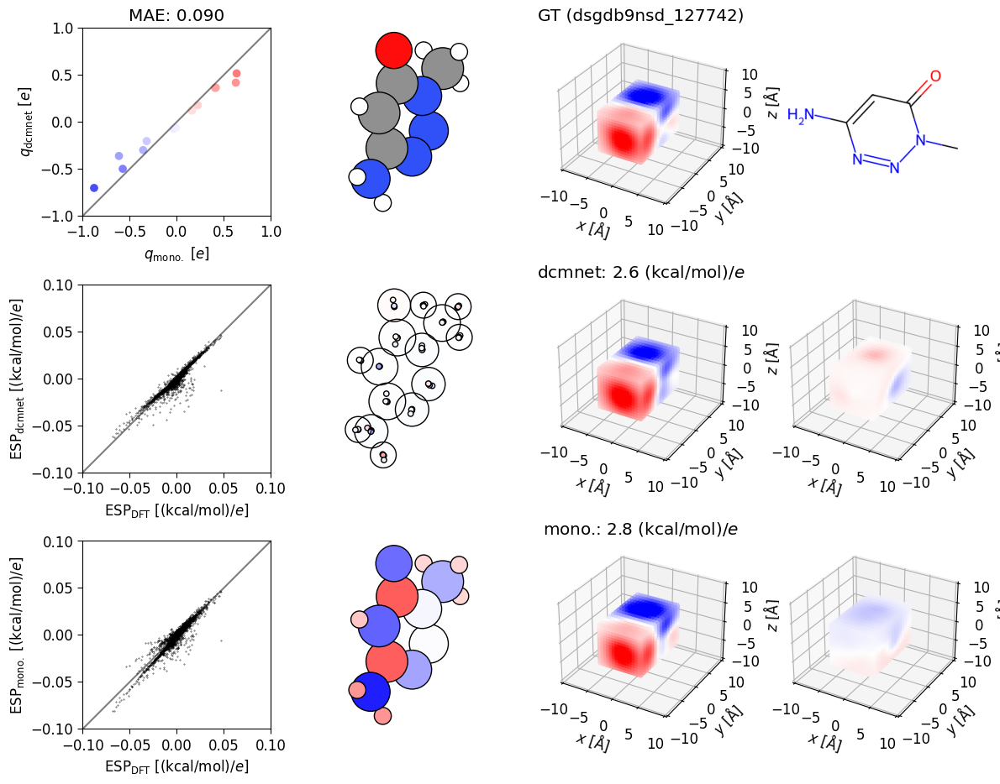

2.7830443
gt: [ 0.229779  -0.982639  -0.4248558]
 m: [ 0.2332916 -1.1433331 -0.3183962]
pc: [ 0.3091129  -0.92343765 -0.82381785]
3.0743697 2.783044 0.29132557
 3.24206 2.78304 0.45902
1368
['dsgdb9nsd_128324']


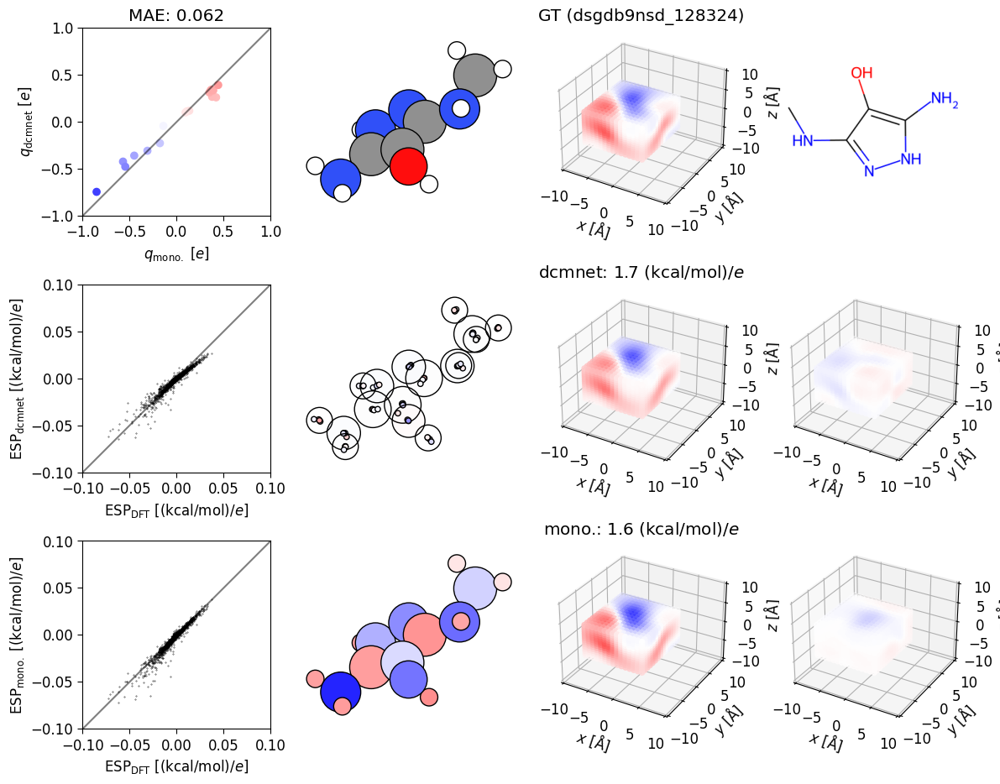

1.8315896
gt: [-0.034241  -0.7015574  0.1609756]
 m: [ 0.07983685 -0.6063517   0.12732995]
pc: [ 0.02260792 -0.65929997  0.12105846]
1.5878271 1.8315896 -0.2437625
 1.70476 1.83159 -0.12683


In [3367]:
for i in range(10):
    randID = np.random.randint(len(valid_batches))
    print(randID)
    batch = valid_batches[randID]
    print(batch["id"])
    
    
    PARAMS4 = pd.read_pickle(
        "/pchem-data/meuwly/boittier/home/jaxeq/runs7/"\
        # "20240830-113204dcm-2-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
        "20240830-163232dcm-4-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
        # "20240831-005331dcm-4-espw-1000-qm9-esp40000-0.npz-re-False/best_1000_params.pkl")
    
    mono, dipo = apply_model(DCM4, PARAMS4, batch, batch_size)
    non_zero = jnp.nonzero(batch["atomic_numbers"])
    error, esp, keys, _ = evaluate_dc(batch, dipo, mono, batch_size, DCM4.n_dcm,
                                           plot="Test",
                                           id=True,
                                  )
    
    test_dipole(batch, DCM4,dipo, mono)

In [3252]:
# test_dipole(batch, DCM4,dipo, mono)

1.3753593
gt: [-0.0475843  0.1332233 -0.5222884]
 m: [ 0.06817143 -0.2844351  -0.5816756 ]
pc: [ 0.03814632  0.06902891 -0.538999  ]
1.6548647 1.3753593 0.27950537
 1.38459 1.37536 0.00923


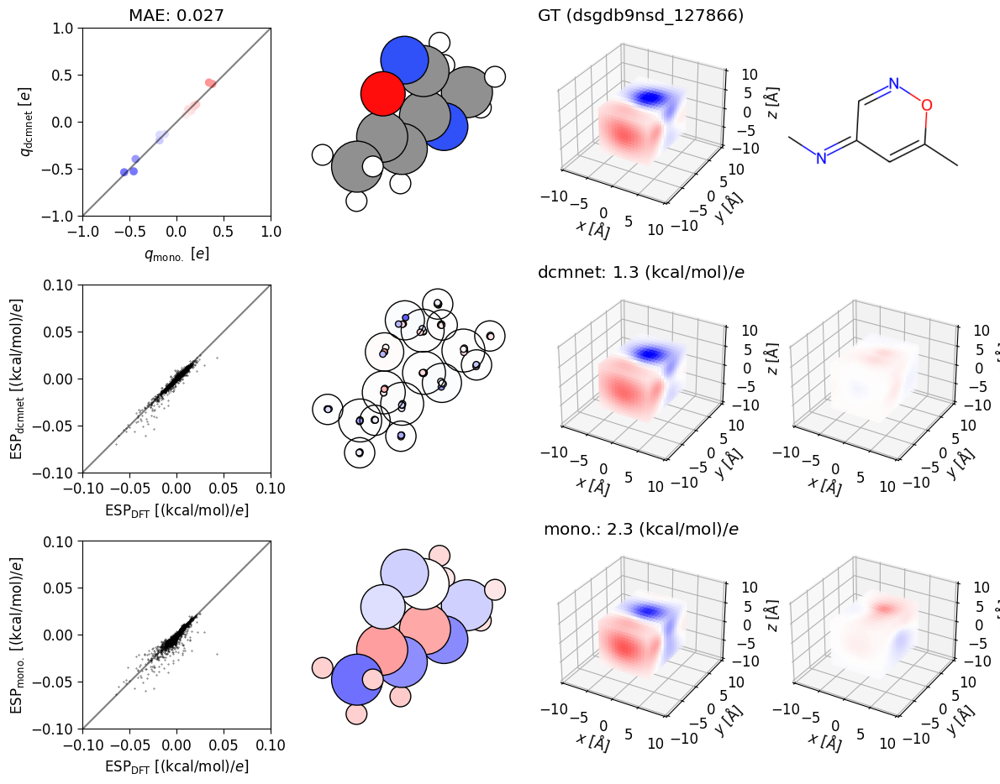

In [3357]:
mono, dipo = apply_model(DCM4, dcm4_params, batch, batch_size)
non_zero = jnp.nonzero(batch["atomic_numbers"])
error, esp, keys, _ = evaluate_dc(batch, dipo, mono, batch_size, DCM4.n_dcm,
                                       plot="Test",
                                       id=True,
                              )

In [3358]:
test_dipole(batch, DCM4,dipo, mono)

0.949812
gt: [ 0.0099261 -0.3730464 -0.0194469]
 m: [ 0.03657922 -0.45226616  0.01984811]
pc: [ 0.06523472 -0.34123057  0.14897108]
1.1544025 0.949812 0.2045905
 0.96079 0.94981 0.01098


In [3116]:
mono.shape

(1, 60, 4)

In [3117]:
dipo.shape

(60, 3, 4)